# Dataloader usage examples

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))

In this first example we are defining a dataloader that loads samples in chunks, ie given a full SAR products, it loads all the patches from one chunk at a time (```patch_order="chunk"```). 
The dataloader does also takes samples from the huggingface repository in case they were not found locally (```online = True```)

In [2]:
from dataloader import get_sar_dataloader


loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1, 1000),
    buffer = (1000, 1000),
    stride = (1, 1000),
    shuffle_files = False,
    patch_order="chunk", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=False, 
    samples_per_prod = 1000,
    cache_size = 1000, 
    online = True, 
    max_products = 20
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")

/Data/gdaga/anaconda3/envs/sar_env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20240103t121147-20240103t121217-051942-0646ac.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20240130t151239-20240130t151254-052337-06541b.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20240517t151240-20240517t151255-053912-068d91.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20240626t053141-20240626t053207-054490-06a193.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20240825t053115-20240825t053148-055365-06c086.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20240830t121144-20240830t121215-055442-06c352.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20241005t121146-20241005t121216-055967-06d7fb.zarr'), PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20241008t151239-20241008t151255-056012-06d9c9.zarr'),

/Data/gdaga/anaconda3/envs/sar_env/lib/python3.13/site-packages/huggingface_hub/file_download.py:980: UserWarning: `local_dir_use_symlinks` parameter is deprecated and will be ignored. The process to download files to a local folder has been updated and do not rely on symlinks anymore. You only need to pass a destination folder as`local_dir`.
For more details, check out https://huggingface.co/docs/huggingface_hub/main/en/guides/download#download-files-to-local-folder.
  warnings.warn(


Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/zarr.json" to "/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/zarr.json".
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az: ['c', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc: ['c', 'zarr.json']
Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/c/0/0" to "/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/c/0/0".
Batch 0: x torch.Size([16, 1, 1001]), y torch.Size([16, 1, 1000])
Batch 1: x torch.Size([16, 1, 1001]), y torch.Size([16, 1, 1000])
Batch 2: x torch.Size([16, 1, 1001]), y torch.Size([16, 1, 1000])
Batch 3: x torch.Size([16, 1, 1001]), y torch.Size([16, 1, 100

In the following snippet we are just loading 10000 vertical samples from a single SAR product that had already been downloaded locally. Here the column order is chosen as the sampling strategy

In [ ]:
from dataloader import get_sar_dataloader, SARTransform, SampleFilter
import functools
from utils import minmax_normalize, RC_MIN, RC_MAX, GT_MIN, GT_MAX

transforms = SARTransform(
    transform_raw = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rc = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rcmc =functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_az = functools.partial(minmax_normalize, array_min=GT_MIN, array_max=GT_MAX)
)
filters = SampleFilter(years=[2023], polarizations=["hh"], stripmap_modes=[1, 2, 3], parts=["PT1", "PT3"])
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    filters=filters,
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1, 1000),
    buffer = (1000, 1000),
    stride = (1, 300),
    transform=transforms,
    shuffle_files = False,
    patch_order="col", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=False, 
    samples_per_prod = 10000,
    cache_size = 100, 
    online = True, 
    max_products=1
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch}, y {y_batch}")


Found 4 repositories by author 'Maya4': ['Maya4/PT1', 'Maya4/PT2', 'Maya4/PT3', 'Maya4/PT4']
Found 396 files in the remote repository: 'Maya4/PT1'
Found 371 files in the remote repository: 'Maya4/PT2'
Found 5 files in the remote repository: 'Maya4/PT3'
Found 201 files in the remote repository: 'Maya4/PT4'
Total files found in remote repository: 967
Selected only files:                                          product_name  stripmap_mode  \
0  s1a-20230508t121142-20230508t121213-048442-05d3c0              1   

  polarization acquisition_date  \
0           hh       2023-05-08   

                                           full_name part store   lat   lon  \
0  /Data/sar_focusing/PT1/s1a-s1-raw-s-hh-2023050...  PT1  None  None  None   

  samples  
0      []  
Files list calculation took 1.17 seconds.
Opening Zarr store for file /Data/sar_focusing/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr at index 0
Zarr stores initialization took 2.02 seconds.
Initialized d

In the following snippet we are just loading 2000 vertical samples from a single SAR product that had already been downloaded locally. Here the chunk order is chosen as the sampling strategy

In [1]:
from dataloader import get_sar_dataloader, SARTransform, SampleFilter
import functools
from utils import minmax_normalize, RC_MIN, RC_MAX, GT_MIN, GT_MAX

transforms = SARTransform(
    transform_raw = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rc = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rcmc =functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_az = functools.partial(minmax_normalize, array_min=GT_MIN, array_max=GT_MAX)
)
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing_new",
    level_from="rcmc",
    filters=SampleFilter(years=[2023], polarizations=["hh"], stripmap_modes=[1, 2, 3, 4, 5, 6]),
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (10000, 1),
    buffer = (1000, 1000),
    stride = (10000, 1),
    transform=transforms,
    shuffle_files = False,
    patch_order="chunk", 
    complex_valued = False,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 2000,
    cache_size = 1000, 
    online = True, 
    max_products=5, 
    positional_encoding=True
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")


Found 4 repositories by author 'Maya4': ['Maya4/PT1', 'Maya4/PT2', 'Maya4/PT3', 'Maya4/PT4']
Found 396 files in the remote repository: 'Maya4/PT1'
Found 371 files in the remote repository: 'Maya4/PT2'
Found 5 files in the remote repository: 'Maya4/PT3'
Found 201 files in the remote repository: 'Maya4/PT4'
Total files found in remote repository: 967
Selected only files:                                           product_name  stripmap_mode  \
0   s1a-20230508t121142-20230508t121213-048442-05d3c0              1   
1   s1a-20230731t121147-20230731t121217-049667-05f8f1              1   
68  s1a-20230618t213535-20230618t213600-049046-05e5da              2   
69  s1a-20230817t213538-20230817t213604-049921-06013c              2   
70  s1a-20231004t213540-20231004t213605-050621-061929              2   

   polarization acquisition_date  \
0            hh       2023-05-08   
1            hh       2023-07-31   
68           hh       2023-06-18   
69           hh       2023-08-17   
70           h

/Data/gdaga/anaconda3/envs/sar_env/lib/python3.13/site-packages/huggingface_hub/file_download.py:982: UserWarning: `local_dir_use_symlinks` parameter is deprecated and will be ignored. The process to download files to a local folder has been updated and do not rely on symlinks anymore. You only need to pass a destination folder as`local_dir`.
For more details, check out https://huggingface.co/docs/huggingface_hub/main/en/guides/download#download-files-to-local-folder.
  warnings.warn(


s1a-s1-raw-s-hh-20230508t121142-20230508(…):   0%|          | 0.00/104M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/zarr.json".
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/zarr.json".
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/zarr.json".
Opening Zarr store for file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr at index 0
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1000, 1000)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1000, 1001)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1000, 1002)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1000, 1003)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d

s1a-s1-raw-s-hh-20230508t121142-20230508(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/c/1/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/c/1/0".
Chunk s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc: ['c', 'zarr.json']


s1a-s1-raw-s-hh-20230508t121142-20230508(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/c/2/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/rcmc/c/2/0".
Chunk s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/c/1/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az: ['c', 'zarr.json']


s1a-s1-raw-s-hh-20230508t121142-20230508(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/c/1/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/c/1/0".
Chunk s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az: ['c', 'zarr.json']


s1a-s1-raw-s-hh-20230508t121142-20230508(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/c/2/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/az/c/2/0".
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr at (1000, 1000) took 16.9561 seconds
Patch transformation took 0.0006 seconds
Complex to real conversion took 0.0002 seconds
Recomputed position arrays for patch size (10000, 1)
Patch positional encoding took 0.0006 seconds
Loading patch (/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, 1000, 1000) took 16.9603 seconds. Stripmap mode: 1
Sample shape for /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr at level rcmc: 54130x23724 took 0.0021 seconds
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr at (1000, 1001

s1a-s1-raw-s-hh-20230731t121147-20230731(…):   0%|          | 0.00/104M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/zarr.json".
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc/zarr.json".
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/zarr.json".
Opening Zarr store for file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr at index 1
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr, patch at (1000, 1000)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr, patch at (1000, 1001)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr, patch at (1000, 1002)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr, patch at (1000, 1003)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f

s1a-s1-raw-s-hh-20230731t121147-20230731(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc/c/1/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc/c/1/0".
Chunk s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc: ['c', 'zarr.json']


s1a-s1-raw-s-hh-20230731t121147-20230731(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc/c/2/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/rcmc/c/2/0".
Chunk s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/c/1/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az: ['c', 'zarr.json']


s1a-s1-raw-s-hh-20230731t121147-20230731(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/c/1/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/c/1/0".
Chunk s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az: ['c', 'zarr.json']


s1a-s1-raw-s-hh-20230731t121147-20230731(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/c/2/0" to "/Data/sar_focusing_new/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr/az/c/2/0".
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr at (1000, 1000) took 19.5001 seconds
Patch transformation took 0.0005 seconds
Complex to real conversion took 0.0001 seconds
Patch positional encoding took 0.0003 seconds
Loading patch (/Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr, 1000, 1000) took 19.5066 seconds. Stripmap mode: 1
Sample shape for /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr at level rcmc: 54130x23724 took 0.0040 seconds
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr at (1000, 1001) took 0.0099 seconds
Patch transformation took 0.000

s1a-s2-raw-s-hh-20230618t213535-20230618(…):   0%|          | 0.00/74.7M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/zarr.json".
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc/zarr.json".
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/zarr.json".
Opening Zarr store for file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr at index 68
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr, patch at (1000, 1000)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr, patch at (1000, 1001)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr, patch at (1000, 1002)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr, patch at (1000, 1003)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05

s1a-s2-raw-s-hh-20230618t213535-20230618(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc/c/1/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc/c/1/0".
Chunk s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20230618t213535-20230618(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc/c/2/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/rcmc/c/2/0".
Chunk s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/c/1/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20230618t213535-20230618(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/c/1/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/c/1/0".
Chunk s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20230618t213535-20230618(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/c/2/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr/az/c/2/0".
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr at (1000, 1000) took 58.5510 seconds
Patch transformation took 0.0007 seconds
Complex to real conversion took 0.0002 seconds
Patch positional encoding took 0.0004 seconds
Loading patch (/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr, 1000, 1000) took 58.5593 seconds. Stripmap mode: 2
Sample shape for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr at level rcmc: 38325x22456 took 0.0019 seconds
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230618t213535-20230618t213600-049046-05e5da.zarr at (1000, 1001) took 0.0104 seconds
Patch transformation took 0.000

s1a-s2-raw-s-hh-20230817t213538-20230817(…):   0%|          | 0.00/74.7M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/zarr.json".
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc/zarr.json".
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/zarr.json".
Opening Zarr store for file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr at index 69
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr, patch at (1000, 1000)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr, patch at (1000, 1001)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr, patch at (1000, 1002)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr, patch at (1000, 1003)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06

s1a-s2-raw-s-hh-20230817t213538-20230817(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc/c/1/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc/c/1/0".
Chunk s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20230817t213538-20230817(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc/c/2/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/rcmc/c/2/0".
Chunk s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/c/1/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20230817t213538-20230817(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/c/1/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/c/1/0".
Chunk s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20230817t213538-20230817(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/c/2/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr/az/c/2/0".
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr at (1000, 1000) took 43.2924 seconds
Patch transformation took 0.0006 seconds
Complex to real conversion took 0.0002 seconds
Patch positional encoding took 0.0004 seconds
Loading patch (/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr, 1000, 1000) took 43.3029 seconds. Stripmap mode: 2
Sample shape for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr at level rcmc: 38325x22456 took 0.0020 seconds
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20230817t213538-20230817t213604-049921-06013c.zarr at (1000, 1001) took 0.0097 seconds
Patch transformation took 0.000

s1a-s2-raw-s-hh-20231004t213540-20231004(…):   0%|          | 0.00/74.7M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/zarr.json".
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc/zarr.json".
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az: ['c', 'zarr.json']


zarr.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/zarr.json" to "/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/zarr.json".
Opening Zarr store for file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr at index 70
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr, patch at (1000, 1000)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr, patch at (1000, 1001)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr, patch at (1000, 1002)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr, patch at (1000, 1003)
Sampling from file /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-06

s1a-s2-raw-s-hh-20231004t213540-20231004(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc/c/1/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc/c/1/0".
Chunk s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20231004t213540-20231004(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc/c/2/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/rcmc/c/2/0".
Chunk s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/c/1/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20231004t213540-20231004(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/c/1/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/c/1/0".
Chunk s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/c/2/0 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az: ['c', 'zarr.json']


s1a-s2-raw-s-hh-20231004t213540-20231004(…):   0%|          | 0.00/240M [00:00<?, ?B/s]

Successfully downloaded "s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/c/2/0" to "/Data/sar_focusing_new/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr/az/c/2/0".
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr at (1000, 1000) took 341.4292 seconds
Patch transformation took 0.0006 seconds
Complex to real conversion took 0.0002 seconds
Patch positional encoding took 0.0004 seconds
Loading patch (/Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr, 1000, 1000) took 341.4437 seconds. Stripmap mode: 2
Sample shape for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr at level rcmc: 38325x22456 took 0.0026 seconds
Base sample loading for /Data/sar_focusing_new/PT1/s1a-s2-raw-s-hh-20231004t213540-20231004t213605-050621-061929.zarr at (1000, 1001) took 0.0116 seconds
Patch transformation took 0.0

In the following snippet we are just loading 2000 vertical samples from a single SAR product that had already been downloaded locally. Here the row order is chosen as the sampling strategy

In [5]:
from dataloader import get_sar_dataloader


loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1, 1000),
    buffer = (1000, 1000),
    stride = (1, 300),
    transform=transforms,
    shuffle_files = False,
    patch_order="chunk", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 2000,
    cache_size = 1000, 
    online = False, 
    max_products=1
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")


Selected only files:  [PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr')]
Files list calculation took 0.00 seconds.
Zarr stores initialization took 2.00 seconds.
[PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr')]
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1000, 1000)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1001, 1000)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1002, 1000)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1003, 1000)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1004, 1000)
Sampling from file /Data/sar_focusing/s1a-s1-raw

In the example below we create a dataloader object that loads the patches as 2D real-valued patches, and loads horizontal patches as long as rows (notice the negative value in the horizontal patch size)

In [6]:
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1, -1),
    buffer = (0, 0),
    stride = (1, 300),
    transform=transforms,
    shuffle_files = False,
    patch_order="chunk", 
    complex_valued = False,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 1000,
    cache_size = 1000, 
    online = True, 
    max_products=1
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")

Found 396 files in the remote repository: '['s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr', 's1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr', 's1a-s1-raw-s-hh-20240103t121147-20240103t121217-051942-0646ac.zarr', 's1a-s1-raw-s-hh-20240130t151239-20240130t151254-052337-06541b.zarr', 's1a-s1-raw-s-hh-20240517t151240-20240517t151255-053912-068d91.zarr', 's1a-s1-raw-s-hh-20240626t053141-20240626t053207-054490-06a193.zarr', 's1a-s1-raw-s-hh-20240825t053115-20240825t053148-055365-06c086.zarr', 's1a-s1-raw-s-hh-20240830t121144-20240830t121215-055442-06c352.zarr', 's1a-s1-raw-s-hh-20241005t121146-20241005t121216-055967-06d7fb.zarr', 's1a-s1-raw-s-hh-20241008t151239-20241008t151255-056012-06d9c9.zarr', 's1a-s1-raw-s-hh-20241125t151237-20241125t151253-056712-06f59c.zarr', 's1a-s1-raw-s-hh-20241219t151235-20241219t151251-057062-07037d.zarr', 's1a-s1-raw-s-hh-20250109t121141-20250109t121211-057367-070f7e.zarr', 's1a-s1-raw-s-hh-20250124t002434-20250124t0025

Found 396 files in the remote repository: '['s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr', 's1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr', 's1a-s1-raw-s-hh-20240103t121147-20240103t121217-051942-0646ac.zarr', 's1a-s1-raw-s-hh-20240130t151239-20240130t151254-052337-06541b.zarr', 's1a-s1-raw-s-hh-20240517t151240-20240517t151255-053912-068d91.zarr', 's1a-s1-raw-s-hh-20240626t053141-20240626t053207-054490-06a193.zarr', 's1a-s1-raw-s-hh-20240825t053115-20240825t053148-055365-06c086.zarr', 's1a-s1-raw-s-hh-20240830t121144-20240830t121215-055442-06c352.zarr', 's1a-s1-raw-s-hh-20241005t121146-20241005t121216-055967-06d7fb.zarr', 's1a-s1-raw-s-hh-20241008t151239-20241008t151255-056012-06d9c9.zarr', 's1a-s1-raw-s-hh-20241125t151237-20241125t151253-056712-06f59c.zarr', 's1a-s1-raw-s-hh-20241219t151235-20241219t151251-057062-07037d.zarr', 's1a-s1-raw-s-hh-20250109t121141-20250109t121211-057367-070f7e.zarr', 's1a-s1-raw-s-hh-20250124t002434-20250124t0025

Zarr stores initialization took 2.06 seconds.
Initialized dataloader with config: buffer=(0, 0), stride=(1, 300), patch_size=(5000, 5000), complex_values=True


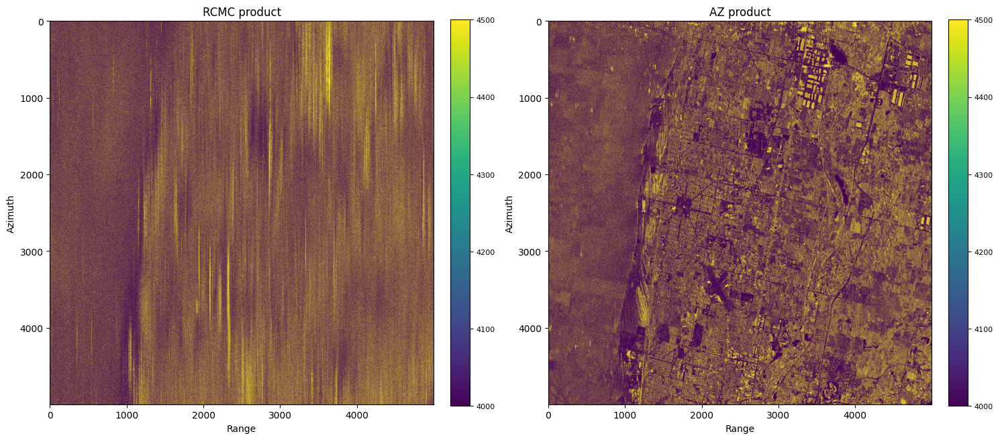

In [3]:
from dataloader import get_sar_dataloader

loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="rcmc",
    level_to="az",
    batch_size=1,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (5000, 5000),
    buffer = (0, 0),
    stride = (1, 300),
    shuffle_files = False,
    patch_order="chunk", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 1000,
    cache_size = 1000, 
    online = True, 
    positional_encoding=True,
    max_products=1
)
loader.dataset.visualize_item(["/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr", 0, 0], vminmax=(4000, 4500))

Found 396 files in the remote repository: '['s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr', 's1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr', 's1a-s1-raw-s-hh-20240103t121147-20240103t121217-051942-0646ac.zarr', 's1a-s1-raw-s-hh-20240130t151239-20240130t151254-052337-06541b.zarr', 's1a-s1-raw-s-hh-20240517t151240-20240517t151255-053912-068d91.zarr', 's1a-s1-raw-s-hh-20240626t053141-20240626t053207-054490-06a193.zarr', 's1a-s1-raw-s-hh-20240825t053115-20240825t053148-055365-06c086.zarr', 's1a-s1-raw-s-hh-20240830t121144-20240830t121215-055442-06c352.zarr', 's1a-s1-raw-s-hh-20241005t121146-20241005t121216-055967-06d7fb.zarr', 's1a-s1-raw-s-hh-20241008t151239-20241008t151255-056012-06d9c9.zarr', 's1a-s1-raw-s-hh-20241125t151237-20241125t151253-056712-06f59c.zarr', 's1a-s1-raw-s-hh-20241219t151235-20241219t151251-057062-07037d.zarr', 's1a-s1-raw-s-hh-20250109t121141-20250109t121211-057367-070f7e.zarr', 's1a-s1-raw-s-hh-20250124t002434-20250124t0025

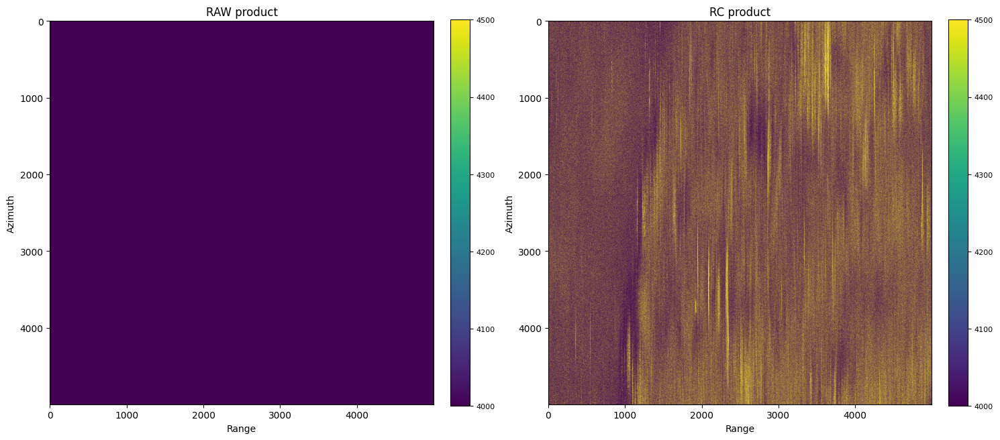

In [2]:
from dataloader import get_sar_dataloader

loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="raw",
    level_to="rc",
    batch_size=1,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (5000, 5000),
    buffer = (0, 0),
    stride = (1, 300),
    shuffle_files = False,
    patch_order="chunk", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 1000,
    cache_size = 1000, 
    online = True, 
    positional_encoding=True,
    max_products=1
)
loader.dataset.visualize_item(["/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr", 0, 0], vminmax=(4000, 4500))

In [6]:
import numpy as np
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="raw",
    level_to="rc",
    batch_size=1,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size=(1, 21984),
    buffer=(0, 0),
    stride=(100, 20000),
    shuffle_files=False,
    patch_order="row", 
    complex_valued=True,
    positional_encoding=False,
    save_samples=False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod=1,
    cache_size=20, 
    online=True, 
    max_products=1, 
    file_pattern="s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr"
)

# Initialize tracking variables for global min/max real values
global_min_real = float('inf')
global_max_real = float('-inf')

for i, (x_batch, y_batch) in enumerate(loader):
    print("raw batch shape:", x_batch.numpy().shape)
    print("rc batch shape: ", y_batch.numpy().shape)

    print(f"raw batch squeezed {np.shape(x_batch.squeeze().numpy())}")
    print(f"Raw batch: {x_batch.squeeze().numpy()}")
    print(f"rc batch squeezed {np.shape(x_batch.squeeze().numpy())}")
    print(f"rc batch: {y_batch.squeeze().numpy()}")

Found 396 files in the remote repository: '['s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr', 's1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr', 's1a-s1-raw-s-hh-20240103t121147-20240103t121217-051942-0646ac.zarr', 's1a-s1-raw-s-hh-20240130t151239-20240130t151254-052337-06541b.zarr', 's1a-s1-raw-s-hh-20240517t151240-20240517t151255-053912-068d91.zarr', 's1a-s1-raw-s-hh-20240626t053141-20240626t053207-054490-06a193.zarr', 's1a-s1-raw-s-hh-20240825t053115-20240825t053148-055365-06c086.zarr', 's1a-s1-raw-s-hh-20240830t121144-20240830t121215-055442-06c352.zarr', 's1a-s1-raw-s-hh-20241005t121146-20241005t121216-055967-06d7fb.zarr', 's1a-s1-raw-s-hh-20241008t151239-20241008t151255-056012-06d9c9.zarr', 's1a-s1-raw-s-hh-20241125t151237-20241125t151253-056712-06f59c.zarr', 's1a-s1-raw-s-hh-20241219t151235-20241219t151251-057062-07037d.zarr', 's1a-s1-raw-s-hh-20250109t121141-20250109t121211-057367-070f7e.zarr', 's1a-s1-raw-s-hh-20250124t002434-20250124t0025

Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (0, 0)
Sample shape for /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr at level raw: 56130x25724 took 0.0012 seconds
Chunk s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw/c/0/2 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw: ['c', 'zarr.json']


/Data/gdaga/anaconda3/envs/sar_env/lib/python3.13/site-packages/huggingface_hub/file_download.py:980: UserWarning: `local_dir_use_symlinks` parameter is deprecated and will be ignored. The process to download files to a local folder has been updated and do not rely on symlinks anymore. You only need to pass a destination folder as`local_dir`.
For more details, check out https://huggingface.co/docs/huggingface_hub/main/en/guides/download#download-files-to-local-folder.
  warnings.warn(


Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw/c/0/2" to "/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw/c/0/2".
Chunk s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw/c/0/3 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr: ['az', 'raw', 'rc', 'rcmc', 'zarr.json']
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw: ['c', 'zarr.json']
Successfully downloaded "s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw/c/0/3" to "/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw/c/0/3".
Chunk s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr/raw/c/0/4 not found locally. Downloading from Hugging Face Zarr archive...
Files in s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr:

Another useful mode to load the data from the dataset consists in concatenating horizontal/vertical patches into matrices that embed sequences of horizontal/vertical patches. In the following example we want to load samples formed by stacking together horizontal patches, so that every sample is represented by a row

In [ ]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from dataloader import get_sar_dataloader, SARTransform
import functools
from utils import minmax_normalize, RC_MIN, RC_MAX, GT_MIN, GT_MAX

transforms = SARTransform(
    transform_raw = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rc = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rcmc =functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_az = functools.partial(minmax_normalize, array_min=GT_MIN, array_max=GT_MAX)
)
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1, 1000),
    buffer = (1000, 1000),
    stride = (1, 300),
    #transform=transforms,
    shuffle_files = False,
    patch_order="row", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 1000,
    cache_size = 100, 
    online = False, 
    max_products=1, 
    concatenate_patches = True, 
    concat_axis=1, 
    positional_encoding=False
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")

/Data/gdaga/anaconda3/envs/sar_env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Selected only files:  [PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr')]
Files list calculation took 0.00 seconds.
Zarr stores initialization took 2.27 seconds.
[PosixPath('/Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr')]
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1000, 0)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1001, 0)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1002, 0)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1003, 0)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr, patch at (1004, 0)
Sampling from file /Data/sar_focusing/s1a-s1-raw-s-hh-20230508t

In [1]:
from dataloader import get_sar_dataloader, SARTransform, SampleFilter
import functools
from utils import minmax_normalize, RC_MIN, RC_MAX, GT_MIN, GT_MAX

transforms = SARTransform(
    transform_raw = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rc = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rcmc =functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_az = functools.partial(minmax_normalize, array_min=GT_MIN, array_max=GT_MAX)
)
filters = SampleFilter(years=[2023], polarizations=["hh", "hv", "vv", "vh"], stripmap_modes=[1, 2])
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    filters=SampleFilter(years=[2023], polarizations=["hh", "hv"], stripmap_modes=[1, 2]),
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1000, 1),
    buffer = (1000, 1000),
    stride = (300, 1),
    #transform=transforms,
    shuffle_files = False,
    patch_order="row", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 1000,
    cache_size = 100, 
    online = False, 
    max_products=1, 
    concatenate_patches = True, 
    concat_axis=0, 
    positional_encoding=True
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")

Files in local directory /Data/sar_focusing: ['.cache', '.gitattributes', 'README.md', 's1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr', 's1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr', 's1a-s1-raw-s-hh-20240103t121147-20240103t121217-051942-0646ac.zarr', 's1a-s1-raw-s-hh-20240130t151239-20240130t151254-052337-06541b.zarr', 's1a-s1-raw-s-hh-20240517t151240-20240517t151255-053912-068d91.zarr', 's1a-s1-raw-s-hh-20240626t053141-20240626t053207-054490-06a193.zarr', 's1a-s1-raw-s-hh-20240825t053115-20240825t053148-055365-06c086.zarr', 's1a-s1-raw-s-hh-20240830t121144-20240830t121215-055442-06c352.zarr', 's1a-s1-raw-s-hh-20241005t121146-20241005t121216-055967-06d7fb.zarr', 's1a-s1-raw-s-hh-20241008t151239-20241008t151255-056012-06d9c9.zarr', 's1a-s1-raw-s-hh-20241125t151237-20241125t151253-056712-06f59c.zarr', 's1a-s1-raw-s-hh-20241219t151235-20241219t151251-057062-07037d.zarr', 's1a-s1-raw-s-hh-20250109t121141-20250109t121211-057367-070f7e.zarr', 's1

ValueError: Must have equal len keys and value when setting with an iterable

In [3]:
from dataloader import get_sar_dataloader, SARTransform
import functools
from utils import minmax_normalize, RC_MIN, RC_MAX, GT_MIN, GT_MAX

transforms = SARTransform(
    transform_raw = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rc = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rcmc =functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_az = functools.partial(minmax_normalize, array_min=GT_MIN, array_max=GT_MAX)
)
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1, 1000),
    buffer = (1000, 1000),
    stride = (1, 300),
    transform=transforms,
    shuffle_files = False,
    patch_order="col", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=False, 
    samples_per_prod = 10000,
    cache_size = 100, 
    online = False, 
    max_products=1, 
    positional_encoding=False
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")

Batch 0: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 1: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 2: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 3: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 4: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 5: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 6: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 7: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 8: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 9: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 10: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 11: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 12: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 13: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch 14: x torch.Size([16, 1, 1000]), y torch.Size([16, 1, 1000])
Batch

In [1]:
from api import list_base_files_in_repo, list_repos_by_author
import pandas as pd

def extract_product_info(filename):
    """
    Extract polarization and product name from SAR filename.
    
    Args:
        filename: String like "s1a-s6-raw-s-vh-20231004t082954-20231004t083025-050613-0618e5.zarr"
    
    Returns:
        tuple: (product_name, polarization)
    """
    # Remove .zarr extension if present
    if not filename.endswith('.zarr'):
        return None, None
    name_without_ext = filename.replace('.zarr', '')
    
    # Split by hyphen
    parts = name_without_ext.split('-')
    
    if len(parts) >= 5:
        # Extract polarization (5th token, index 4)
        polarization = parts[4].upper()  # Convert to uppercase (VH, VV, HH, HV)
        
        # Create product name by removing the polarization part
        product_parts = parts[:4] + parts[5:]  # Skip the polarization part
        product_name = '-'.join(product_parts)
        
        return product_name, polarization
    else:
        # Fallback if filename doesn't match expected pattern
        return name_without_ext, "UNKNOWN"

# filename = "s1a-s6-raw-s-vh-20231004t082954-20231004t083025-050613-0618e5.zarr"
# product_name, polarization = extract_product_info(filename)
# print(f"Original: {filename}")
# print(f"Product: {product_name}")
# print(f"Polarization: {polarization}")

# Your DataFrame creation code:
projects = list_repos_by_author(author="Maya4") #["pt4", "PT2", "pt3"]
print(projects)
df = pd.DataFrame({"Product name": [], "File name": [], "Polarization": [], "Project name": []})

for project in projects: 
    remote_files = list_base_files_in_repo(
        repo_id=f"{project}",
    )
    for file in remote_files:
        prod_name, polarization = extract_product_info(file)
        if prod_name is not None and polarization is not None:
            df = pd.concat([df, pd.DataFrame({
                "Product name": [prod_name],
                "File name": [file],
                "Polarization": [polarization],
                "Project name": [project]
            })], ignore_index=True)

df

['Maya4/PT1', 'Maya4/PT2', 'Maya4/PT3', 'Maya4/PT4']


,Product name,File name,Polarization,Project name
0,s1a-s1-raw-s-20230508t121142-20230508t121213-0...,s1a-s1-raw-s-hh-20230508t121142-20230508t12121...,HH,Maya4/PT1
1,s1a-s1-raw-s-20230731t121147-20230731t121217-0...,s1a-s1-raw-s-hh-20230731t121147-20230731t12121...,HH,Maya4/PT1
2,s1a-s1-raw-s-20240103t121147-20240103t121217-0...,s1a-s1-raw-s-hh-20240103t121147-20240103t12121...,HH,Maya4/PT1
3,s1a-s1-raw-s-20240130t151239-20240130t151254-0...,s1a-s1-raw-s-hh-20240130t151239-20240130t15125...,HH,Maya4/PT1
4,s1a-s1-raw-s-20240517t151240-20240517t151255-0...,s1a-s1-raw-s-hh-20240517t151240-20240517t15125...,HH,Maya4/PT1
...,...,...,...,...
962,s1a-s6-raw-s-20250121t055851-20250121t055922-0...,s1a-s6-raw-s-vv-20250121t055851-20250121t05592...,VV,Maya4/PT4
963,s1a-s6-raw-s-20250207t082919-20250207t082952-0...,s1a-s6-raw-s-vv-20250207t082919-20250207t08295...,VV,Maya4/PT4
964,s1a-s6-raw-s-20250214t195123-20250214t195144-0...,s1a-s6-raw-s-vv-20250214t195123-20250214t19514...,VV,Maya4/PT4
965,s1a-s6-raw-s-20250323t004407-20250323t004440-0...,s1a-s6-raw-s-vv-20250323t004407-20250323t00444...,VV,Maya4/PT4


In [1]:
from dataloader import get_sar_dataloader, SARTransform
import functools
from utils import minmax_normalize, RC_MIN, RC_MAX, GT_MIN, GT_MAX

transforms = SARTransform(
    transform_raw = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rc = functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_rcmc =functools.partial(minmax_normalize, array_min=RC_MIN, array_max=RC_MAX),
    transform_az = functools.partial(minmax_normalize, array_min=GT_MIN, array_max=GT_MAX)
)
loader = get_sar_dataloader(
    data_dir="/Data/sar_focusing",
    level_from="rcmc",
    level_to="az",
    batch_size=16,
    num_workers=0,
    patch_mode="rectangular", 
    patch_size = (1000, 100),
    buffer = (1000, 1000),
    stride = (1000, 100),
    max_base_sample_size = (10000, 5000),
    transform=transforms,
    shuffle_files = False,
    patch_order="col", 
    complex_valued = True,
    save_samples = False, 
    backend="zarr", 
    verbose=True, 
    samples_per_prod = 100,
    cache_size = 1000, 
    online = True, 
    max_products=1, 
    concatenate_patches = True, 
    concat_axis=0, 
    positional_encoding=True
)
for i, (x_batch, y_batch) in enumerate(loader):
    print(f"[BATCH {i}] x_batch[0]: {x_batch[0]}")
    print(f"[BATCH {i}] y_batch[0]: {y_batch[0]}")
    # print(f"Batch {i}: x {x_batch.shape}, y {y_batch.shape}")
    # if (x_batch[0] == x_batch[2]).all():
    #     print(f"Batch number 1 equals to batch number 2")
    #     break

Found 396 files in the remote repository: '['s1a-s1-raw-s-hh-20230508t121142-20230508t121213-048442-05d3c0.zarr', 's1a-s1-raw-s-hh-20230731t121147-20230731t121217-049667-05f8f1.zarr', 's1a-s1-raw-s-hh-20240103t121147-20240103t121217-051942-0646ac.zarr', 's1a-s1-raw-s-hh-20240130t151239-20240130t151254-052337-06541b.zarr', 's1a-s1-raw-s-hh-20240517t151240-20240517t151255-053912-068d91.zarr', 's1a-s1-raw-s-hh-20240626t053141-20240626t053207-054490-06a193.zarr', 's1a-s1-raw-s-hh-20240825t053115-20240825t053148-055365-06c086.zarr', 's1a-s1-raw-s-hh-20240830t121144-20240830t121215-055442-06c352.zarr', 's1a-s1-raw-s-hh-20241005t121146-20241005t121216-055967-06d7fb.zarr', 's1a-s1-raw-s-hh-20241008t151239-20241008t151255-056012-06d9c9.zarr', 's1a-s1-raw-s-hh-20241125t151237-20241125t151253-056712-06f59c.zarr', 's1a-s1-raw-s-hh-20241219t151235-20241219t151251-057062-07037d.zarr', 's1a-s1-raw-s-hh-20250109t121141-20250109t121211-057367-070f7e.zarr', 's1a-s1-raw-s-hh-20250124t002434-20250124t0025